# Data Wrangling & Exploration 

In [1]:
#!pip install scikit-image

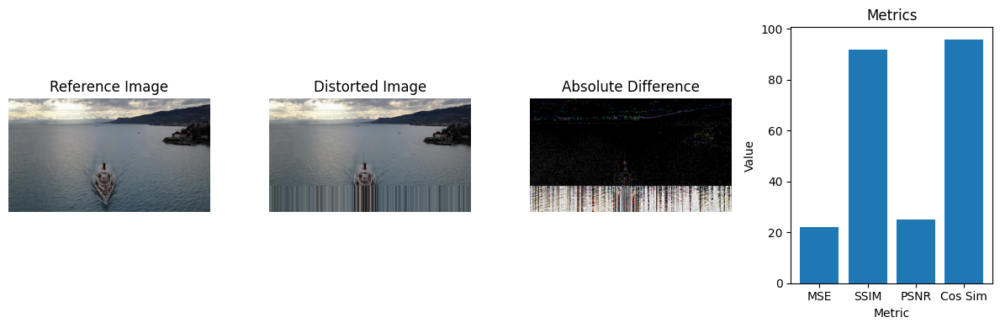

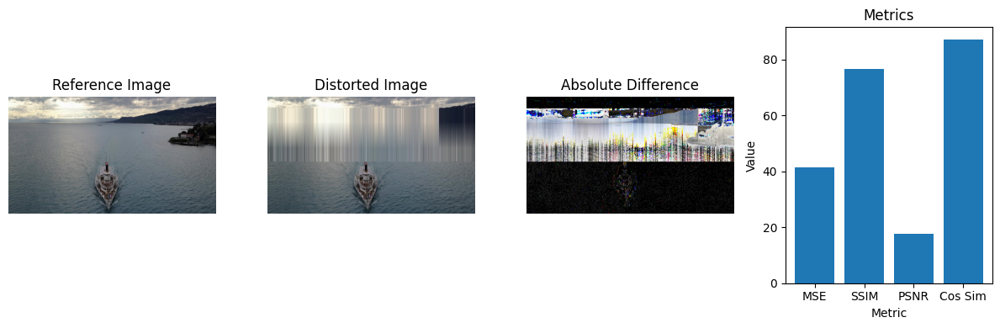

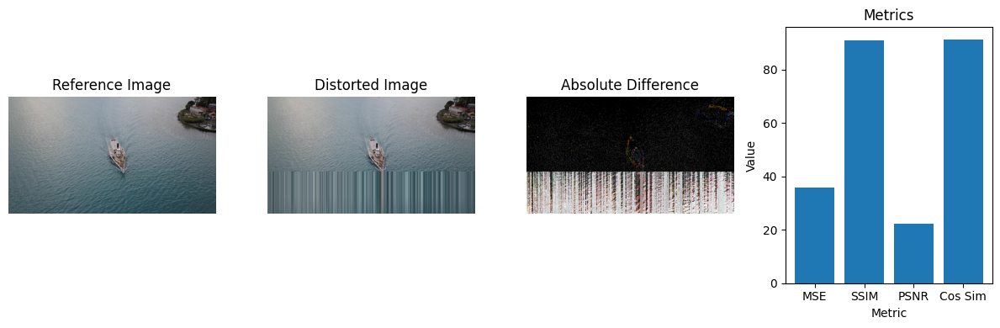

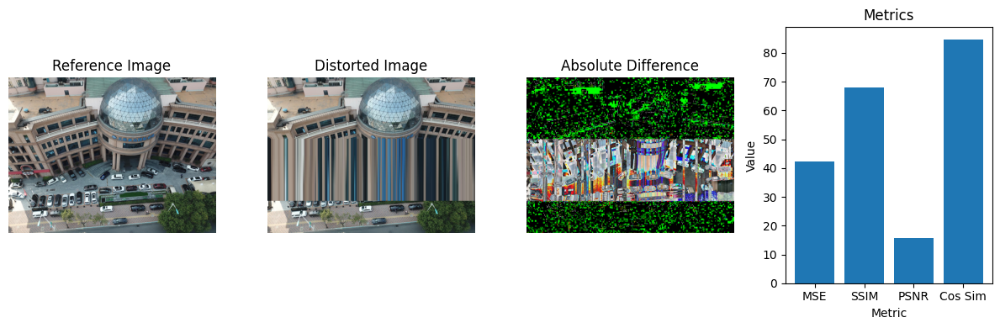

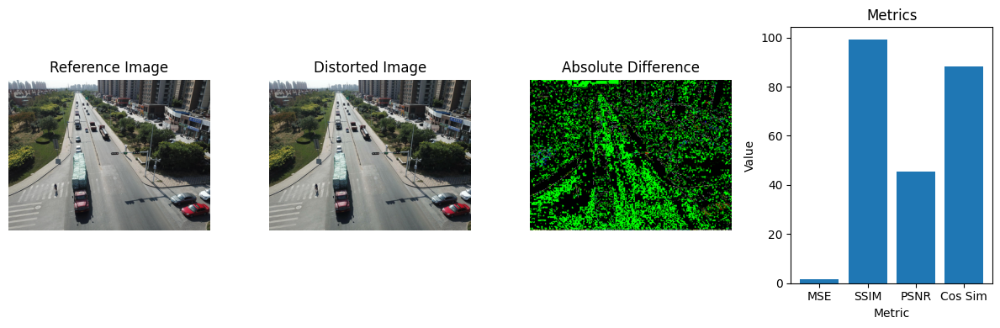

...

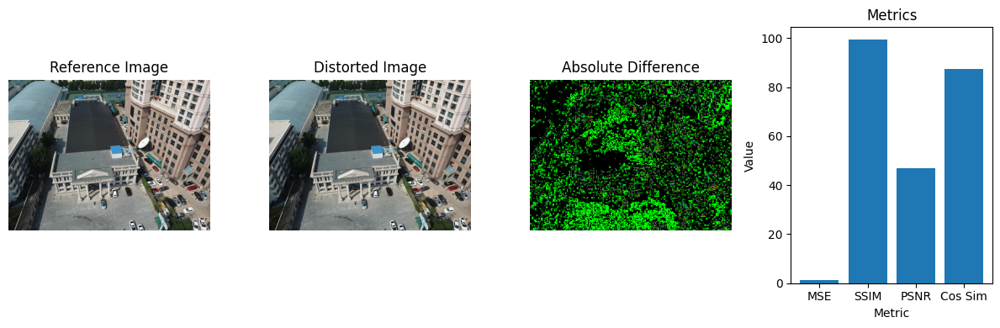

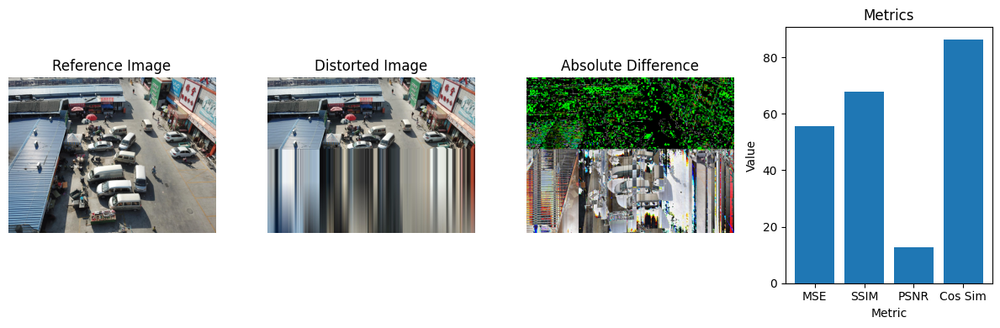

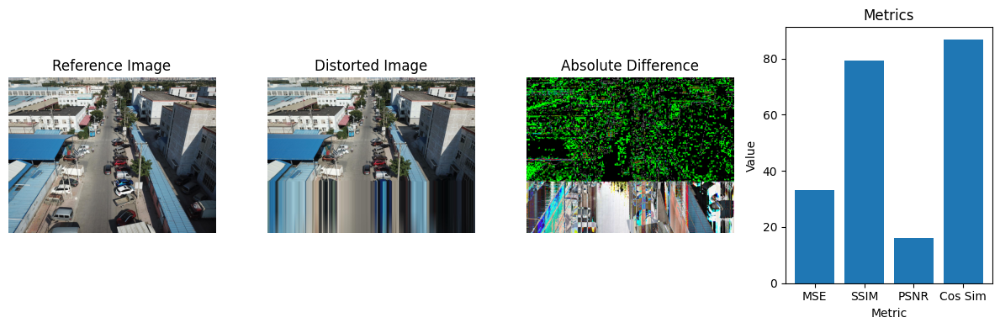

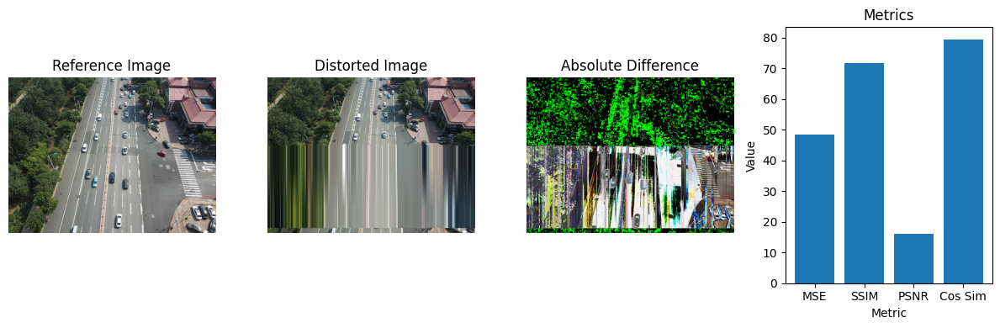

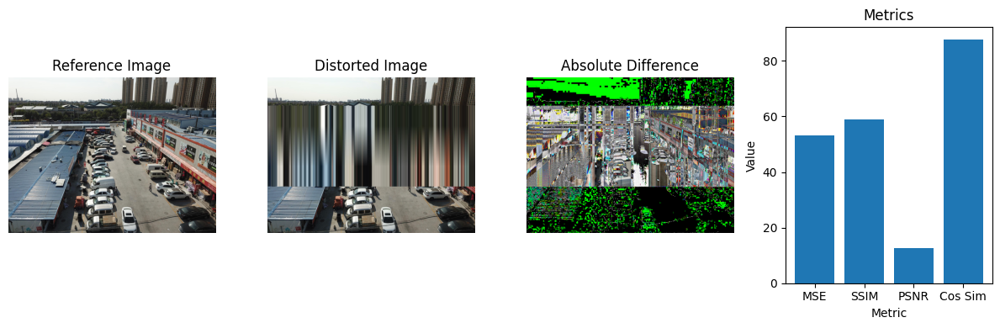

In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from scipy.spatial.distance import cosine

images_folder_path = 'images'
distorted_folder_path = 'distorted'

# Create lists to store the metrics
mse_values = []
ssim_values = []
psnr_values = []
cosine_values = []

# Sort the image and distorted files
image_files = sorted([file for file in os.listdir(images_folder_path) if file.endswith('.jpg')])
distorted_files = sorted([file for file in os.listdir(distorted_folder_path) if file.endswith('.jpeg')])

# Select the first 20 files
image_files = image_files[:72]
distorted_files = distorted_files[:72]

# Read the images and calculate the metrics
for image_file, distorted_file in zip(image_files, distorted_files):
    # Image paths
    image_path = os.path.join(images_folder_path, image_file)
    distorted_path = os.path.join(distorted_folder_path, distorted_file)

    # Load the images
    image = Image.open(image_path)
    distorted_image = Image.open(distorted_path)

    # Resize the distorted image
    resized_image = image.resize(distorted_image.size)

    # Convert the images to NumPy arrays
    image_array = np.array(resized_image)
    distorted_array = np.array(distorted_image)

    # Calculate the metrics
    mse = np.mean((image_array - distorted_array) ** 2)
    ssim_value = ssim(image_array, distorted_array, win_size=3, multichannel=True)*100
    psnr_value = psnr(image_array, distorted_array, data_range=image_array.max() - image_array.min())
    cosine_sim = (1 - cosine(image_array.ravel(), distorted_array.ravel()))*100

    # Append the metrics to the lists
    mse_values.append(mse)
    ssim_values.append(ssim_value)
    psnr_values.append(psnr_value)
    cosine_values.append(cosine_sim)

    # Plot the metrics
    plt.figure(figsize=(12, 4))

    plt.subplot(141)
    plt.imshow(image)
    plt.title('Reference Image')
    plt.axis('off')

    plt.subplot(142)
    plt.imshow(distorted_image)
    plt.title('Distorted Image')
    plt.axis('off')

    plt.subplot(143)
    plt.imshow(np.abs(image_array - distorted_array), cmap='hot', vmin=0, vmax=np.max(np.abs(image_array - distorted_array)))
    plt.title('Absolute Difference')
    plt.axis('off')

    plt.subplot(144)
    values = [mse, ssim_value, psnr_value, cosine_sim]
    metrics = ['MSE', 'SSIM', 'PSNR', 'Cos Sim']
    plt.bar(metrics, values)
    plt.title('Metrics')
    plt.xlabel('Metric')
    plt.ylabel('Value')

    plt.tight_layout()
    plt.show()
    
    


In [ ]:
# Plot the MSE values per figure
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(mse_values) + 1), mse_values, marker='o')
plt.title('MSE per Figure')
plt.xlabel('Figure')
plt.ylabel('MSE')
plt.xticks(range(1, len(mse_values) + 1), fontsize=8)
plt.yticks(fontsize=8)
plt.grid(True)
plt.gca().set_xticks(range(1, len(mse_values) + 1, 2))
plt.tight_layout()
plt.show()

# Plot the Sim Values values per figure
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(ssim_values) + 1), ssim_values, marker='o')
plt.title('Ssim per Figure')
plt.xlabel('Figure')
plt.ylabel('Ssim')
plt.xticks(range(1, len(ssim_values) + 1), fontsize=8)
plt.grid(True)
plt.gca().set_xticks(range(1, len(mse_values) + 1, 2))
plt.tight_layout()
plt.show()


# Plot the psnr Values values per figure
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(psnr_values) + 1), psnr_values, marker='o')
plt.title('Psnr per Figure')
plt.xlabel('Figure')
plt.ylabel('Psnr')
plt.xticks(range(1, len(psnr_values) + 1), fontsize=8)
plt.grid(True)
plt.gca().set_xticks(range(1, len(mse_values) + 1, 2))
plt.tight_layout()
plt.show()


# Plot the psnr Values values per figure
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(cosine_values) + 1), cosine_values, marker='o' )
plt.title('Cosine per Figure')
plt.xlabel('Figure')
plt.ylabel('cosine')
plt.xticks(range(1, len(cosine_values) + 1), fontsize=8)
plt.grid(True)
plt.gca().set_xticks(range(1, len(mse_values) + 1, 2))
plt.tight_layout()
plt.show()


In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from scipy.spatial.distance import cosine


distorted_file = 'distorted_grid.png'
image_file = 'image_grid.png'

# Create lists to store the metrics
mse_values = []
ssim_list = []
psnr_list = []
cosine_list = []



# Load the image
distorted_image = Image.open(distorted_file)
distorted_image = distorted_image.convert('RGB') 
image = Image.open(image_file).convert('RGB')

resized_image = image.resize(distorted_image.size)



# Convert the images to NumPy arrays
distorted_array = np.array(distorted_image)
image_array = np.array(resized_image)

# Calculate the metrics
mse = np.mean((image_array - distorted_array) ** 2)
ssim_value = ssim(image_array, distorted_array, win_size=3, multichannel=True)         
psnr_value = psnr(image_array, distorted_array, data_range=image_array.max() - image_array.min())
cosine_sim = 1 - cosine(image_array.ravel(), distorted_array.ravel())



plt.figure(figsize=(8, 6))
im = plt.imshow((image_array - distorted_array) ** 2, cmap='hot', vmin=0, vmax=np.max((image_array - distorted_array) ** 2))
cbar = plt.colorbar(im, label='Squared Difference', shrink=0.6)
plt.xlabel('Pixel Column')
plt.ylabel('Pixel Row')
plt.title(f'MSE Colormap - image and Distorted')
plt.show()

last_index = len(mse_values) - 1
print(f"MSE between the images: {mse}")
print(f"SSIM between the images: {ssim_value}")
print(f"PSNR between the images: {psnr_value}")
print(f"Cosine similarity between the images: {cosine_sim}")

